In [1]:
import numpy as np
from os.path import abspath, expanduser
from ECOv002_CMR import ECOSTRESS_CMR_search, download_file, GranuleID, download_ECOSTRESS_granule
from ECOv002_granules import ET_COLORMAP, L2TSTARS, L3TSEB, L3TMET
from PMJPL import PMJPL, PMJPL_parameter_from_IGBP
from MCD12C1_2019_v006 import load_MCD12C1_IGBP

from PMJPL import leaf_conductance_to_sensible_heat

In [2]:
aquisition_date = "2020-06-23"
orbit = 11144
scene = 2
tile = "10TFQ"

In [3]:
L2T_LSTE_granule = download_ECOSTRESS_granule(
    product="L2T_LSTE", 
    orbit=orbit,
    scene=scene,
    tile=tile, 
    aquisition_date=aquisition_date
)

L2T_LSTE_granule

[2025-08-19 15:38:38 INFO] file already downloaded: ~/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01_water.tif
[2025-08-19 15:38:38 INFO] file already downloaded: ~/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01_cloud.tif
[2025-08-19 15:38:38 INFO] file already downloaded: ~/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01_view_zenith.tif
[2025-08-19 15:38:38 INFO] file already downloaded: ~/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01_height.tif
[2025-08-19 15:38:38 INFO] file already downloaded: ~/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01_QC.tif
[2025-08-19 15:38:38 INFO] file

L2TLSTE("/Users/halverso/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01")

In [4]:
geometry = L2T_LSTE_granule.geometry
time_UTC = L2T_LSTE_granule.time_UTC

[2025-08-19 15:38:38 INFO] started reading L2T_LSTE LST: /Users/halverso/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01_LST.tif
[2025-08-19 15:38:38 INFO] finished reading L2T_LSTE LST (0.02s)
[2025-08-19 15:38:38 INFO] started reading L2T_LSTE cloud: /Users/halverso/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01_cloud.tif
[2025-08-19 15:38:38 INFO] finished reading L2T_LSTE cloud (0.01s)


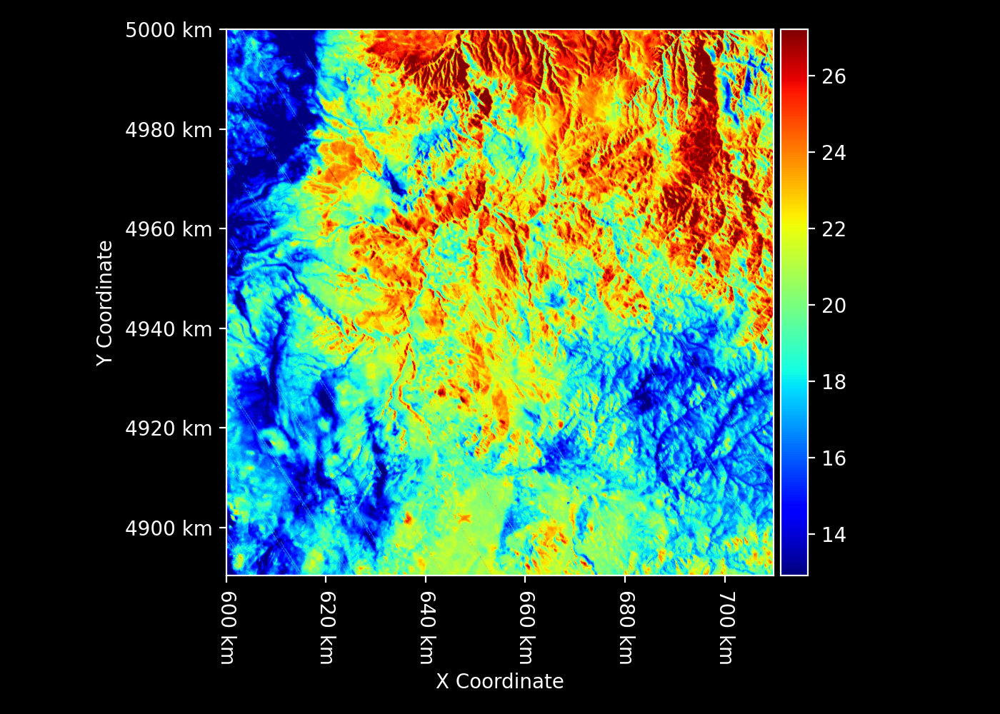

In [5]:
ST_C = L2T_LSTE_granule.ST_C
ST_C

In [6]:
# L2T_STARS_granule = download_ECOSTRESS_granule(
#     product="L2T_STARS", 
#     tile=tile, 
#     aquisition_date=aquisition_date
# )

L2T_STARS_granule = L2TSTARS("~/Downloads/ECOv003_L2T_STARS_10TFQ_20200623_0711_02")

L2T_STARS_granule

L2TSTARS("/Users/halverso/Downloads/ECOv003_L2T_STARS_10TFQ_20200623_0711_02")

[2025-08-19 15:38:39 INFO] started reading  NDVI: /Users/halverso/Downloads/ECOv003_L2T_STARS_10TFQ_20200623_0711_02/ECOv003_L2T_STARS_10TFQ_20200623_0711_02_NDVI.tif
[2025-08-19 15:38:39 INFO] finished reading  NDVI (0.03s)


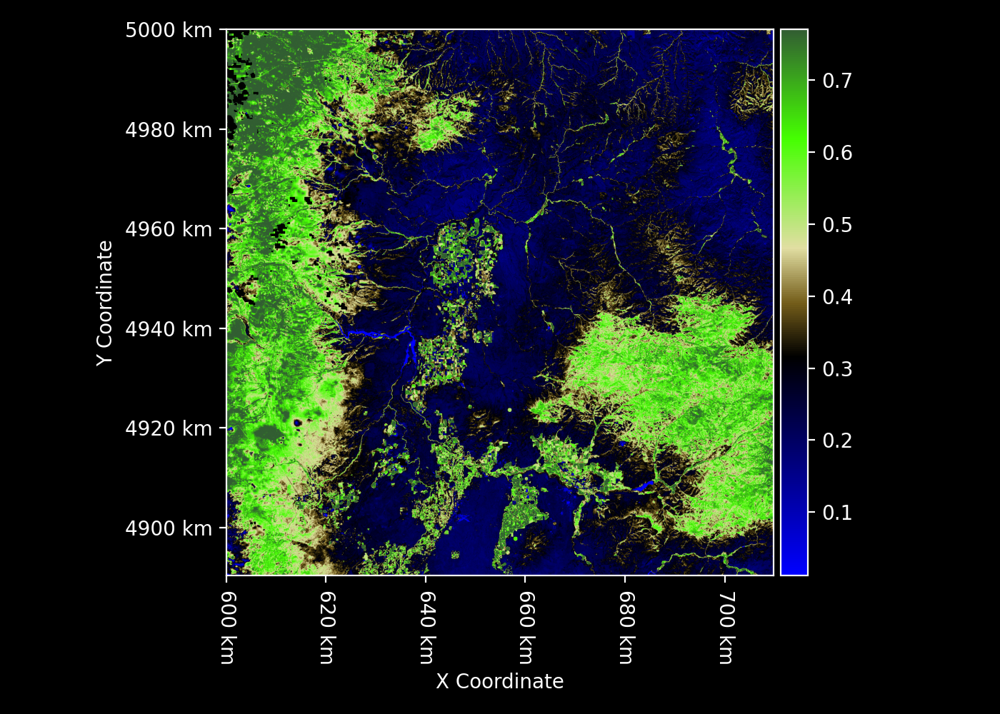

In [7]:
NDVI = L2T_STARS_granule.NDVI
NDVI

[2025-08-19 15:38:39 INFO] started reading  albedo: /Users/halverso/Downloads/ECOv003_L2T_STARS_10TFQ_20200623_0711_02/ECOv003_L2T_STARS_10TFQ_20200623_0711_02_albedo.tif
[2025-08-19 15:38:39 INFO] finished reading  albedo (0.03s)


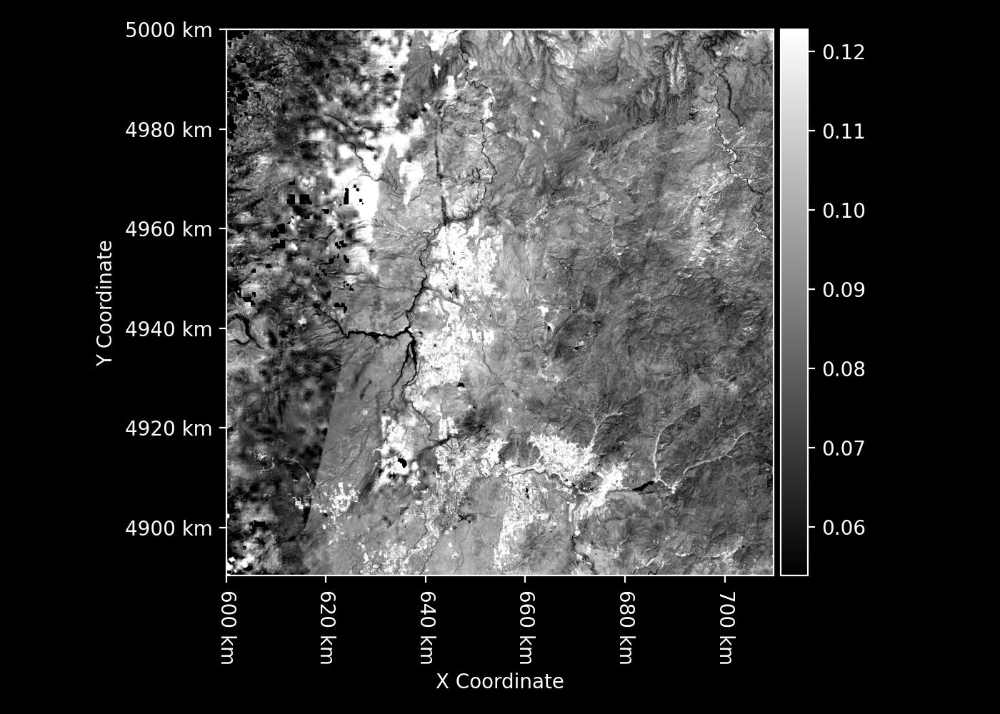

In [8]:
albedo = L2T_STARS_granule.albedo
albedo

In [9]:
# L3T_SEB_granule = download_ECOSTRESS_granule(
#     product="L3T_SEB", 
#     orbit=orbit,
#     scene=scene,
#     tile=tile, 
#     aquisition_date=aquisition_date
# )

L3T_SEB_granule = L3TSEB("/Users/halverso/Downloads/ECOv002_L3T_SEB_11144_002_10TFQ_20200623T143848_0711_02")

L3T_SEB_granule

L3TSEB("/Users/halverso/Downloads/ECOv002_L3T_SEB_11144_002_10TFQ_20200623T143848_0711_02")

[2025-08-19 15:38:39 INFO] started reading L3T_SEB Rn: /Users/halverso/Downloads/ECOv002_L3T_SEB_11144_002_10TFQ_20200623T143848_0711_02/ECOv002_L3T_SEB_11144_002_10TFQ_20200623T143848_0711_02_Rn.tif
[2025-08-19 15:38:39 INFO] finished reading L3T_SEB Rn (0.03s)


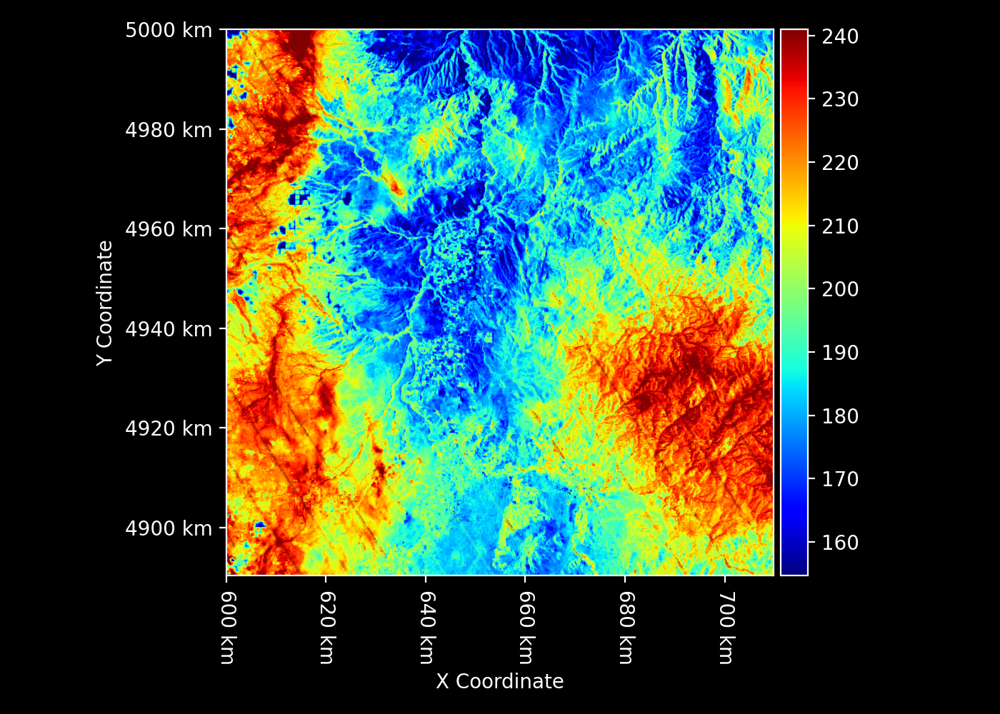

In [10]:
Rn = L3T_SEB_granule.variable("Rn")
Rn

In [11]:
# L3T_MET_granule = download_ECOSTRESS_granule(
#     product="L3T_MET", 
#     orbit=orbit,
#     scene=scene,
#     tile=tile, 
#     aquisition_date=aquisition_date,
#     parent_directory=ECOSTRESS_download_directory
# )

L3T_MET_granule = L3TMET("/Users/halverso/Downloads/ECOv002_L3T_MET_11144_002_10TFQ_20200623T143848_0711_02")

L3T_MET_granule

L3TMET("/Users/halverso/Downloads/ECOv002_L3T_MET_11144_002_10TFQ_20200623T143848_0711_02")

[2025-08-19 15:38:40 INFO] started reading L3T_MET Ta: /Users/halverso/Downloads/ECOv002_L3T_MET_11144_002_10TFQ_20200623T143848_0711_02/ECOv002_L3T_MET_11144_002_10TFQ_20200623T143848_0711_02_Ta.tif
[2025-08-19 15:38:40 INFO] finished reading L3T_MET Ta (0.05s)


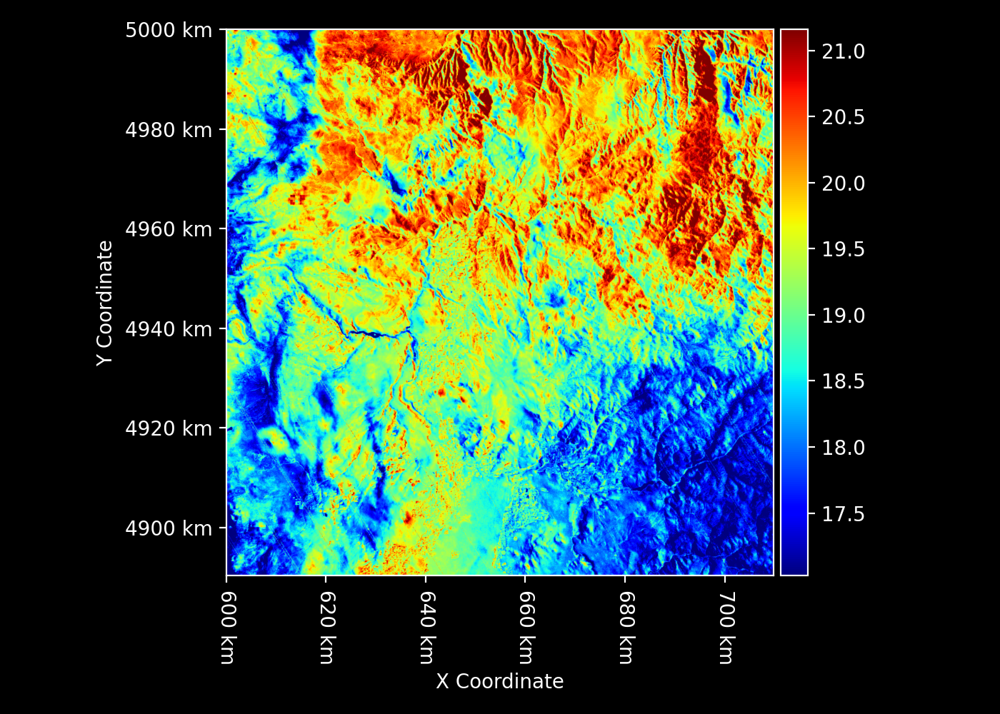

In [12]:
Ta_C = L3T_MET_granule.variable("Ta")
Ta_C

[2025-08-19 15:38:40 INFO] started reading L3T_MET RH: /Users/halverso/Downloads/ECOv002_L3T_MET_11144_002_10TFQ_20200623T143848_0711_02/ECOv002_L3T_MET_11144_002_10TFQ_20200623T143848_0711_02_RH.tif
[2025-08-19 15:38:40 INFO] finished reading L3T_MET RH (0.03s)


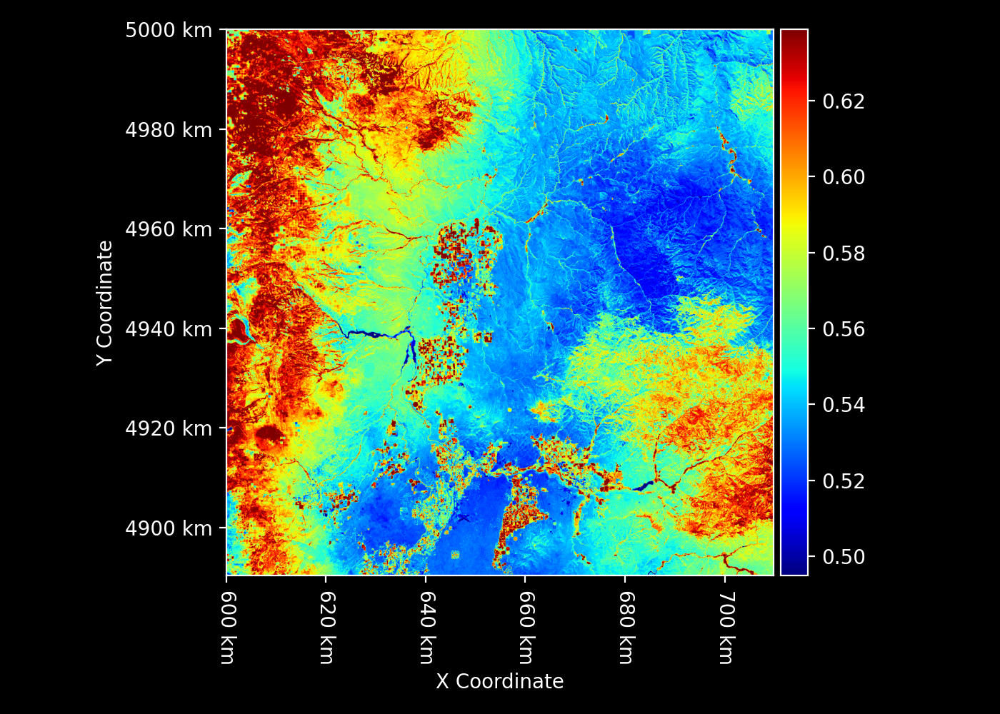

In [13]:
RH = L3T_MET_granule.variable("RH")
RH

[2025-08-19 15:38:41 INFO] started reading L2T_LSTE height: /Users/halverso/data/ECOSTRESS/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01/ECOv002_L2T_LSTE_11144_002_10TFQ_20200623T143848_0712_01_height.tif
[2025-08-19 15:38:41 INFO] finished reading L2T_LSTE height (0.05s)


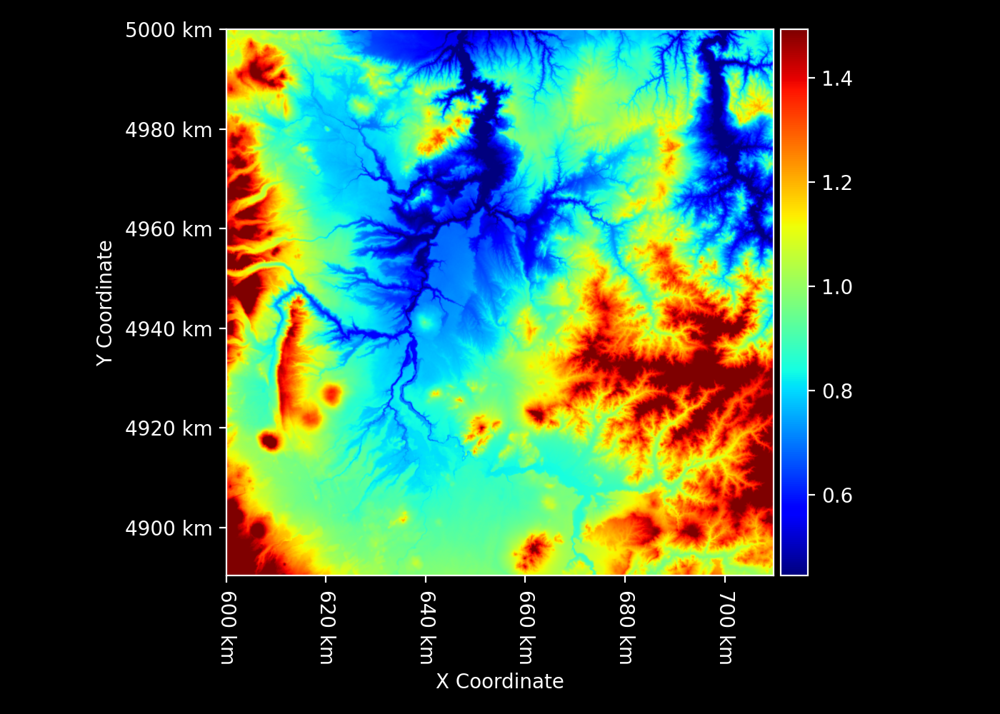

In [14]:
elevation_km = L2T_LSTE_granule.elevation_km
elevation_km

In [15]:
results = PMJPL(
    geometry=geometry,
    time_UTC=time_UTC,
    NDVI=NDVI,
    Ta_C=Ta_C,
    RH=RH,
    Rn_Wm2=Rn,
    albedo=albedo,
    ST_C=ST_C,
    elevation_km=elevation_km
)

[2025-08-19 15:38:41 INFO] retrieving Tmin from GEOS-5 FP inst3_2d_asm_Nx T2MMIN for 2020-06-23 14:38 UTC
[2025-08-19 15:38:41 INFO] searching GEOS-5 FP inst3_2d_asm_Nx at 2020-06-23 14:38:48 UTC
[2025-08-19 15:38:41 INFO] interpolating GEOS-5 FP inst3_2d_asm_Nx T2MMIN from 2020-06-23 12:00 UTC and 2020-06-23 15:00 UTC to 2020-06-23 14:38 UTC
[2025-08-19 15:38:41 INFO] searching GEOS-5 FP inst3_2d_asm_Nx at 2020-06-23 14:38:48 UTC
[2025-08-19 15:38:41 INFO] interpolating GEOS-5 FP inst3_2d_asm_Nx T2MMIN from 2020-06-23 12:00 UTC and 2020-06-23 15:00 UTC to 2020-06-23 14:38 UTC
[2025-08-19 15:38:41 INFO] GEOS-5 FP interpolation complete (0.14 seconds)
[2025-08-19 15:38:41 INFO] variable G_Wm2 min: 0.000 mean: 16.320 max: 32.884 nan: 0.82% (nan)
[2025-08-19 15:38:42 INFO] calculating PM-MOD meteorology
[2025-08-19 15:38:42 INFO] variable specific_humidity min: 0.003 mean: 0.007 max: 0.013 nan: 0.00% (nan)
[2025-08-19 15:38:42 INFO] variable rho_kgm3 min: 1.234 mean: 1.370 max: 1.629 nan:

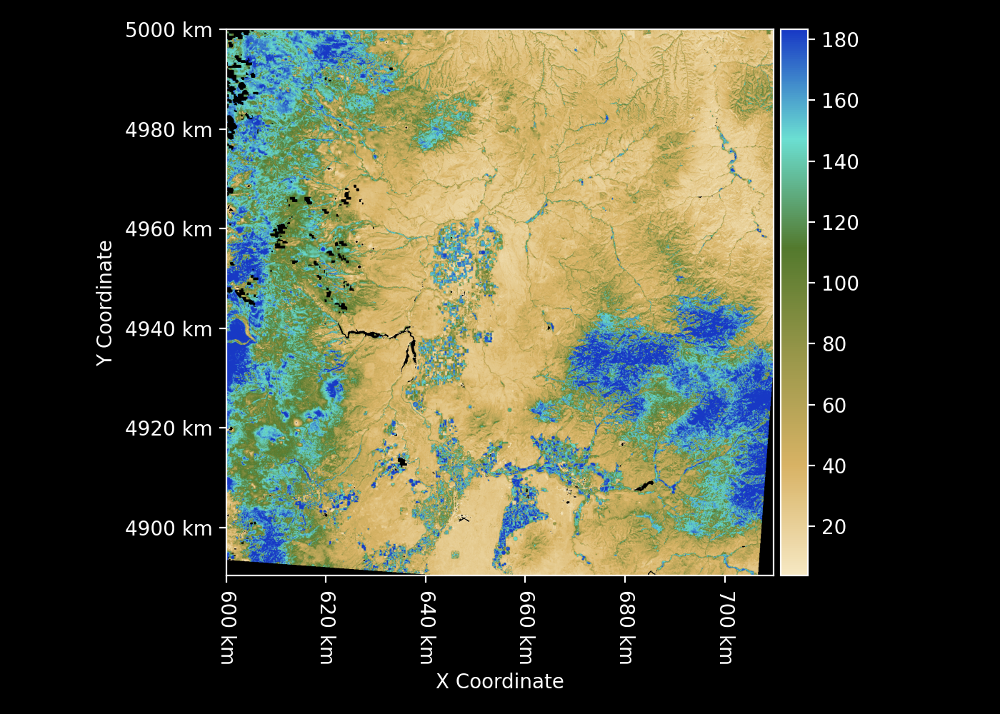

In [17]:
LE_Wm2 = results["LE_Wm2"]
LE_Wm2.cmap = ET_COLORMAP
LE_Wm2